<a href="https://colab.research.google.com/github/Hasham97/C7082-2024/blob/main/C7082_23358800_Assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Introduction**
YOLO was published by Joseph Redmon et al in 2016. For the very first time, it presented a real-time end-to-end approach for object detection. YOLO is an abbreviation for “You Only Look Once”, which means that it is able to establish to detect, classify or segment an image with a single look pass of the network, as opposed to the approaches which had been used earlier. Also, YOLO uses a more straightforward output to predict the image detection outputs in comparison to Fast R-CNN, which used two separate outputs; a regression for the coordinate boxes and the classification of the probabilities.


Since the first YOLO was published in 2016, many versions were released and each new one was better in accomplishment of tasks. YOLOv2 and YOLOv3 was published in 2017 and 2018, respectively by Joseph Redmon and Ali Farhadi. YOLOv4 and YOLOv5 were published in the same year 2020 by different authors than the original ones namely Alexey Bochkovskiy, Chien-Yao Wang, and Hong-Yuan Mark Liao (who published YOLOv4). YOLOv5 was released by Glen Jocher, the CEO and founder of Ultralytics, which is a software development company in the USA. YOLOv6 and YOLOv7 were also published in the same year 2022 but by different authors. YOLOv8 came in to being in early 2023 by Ultralytics, the same company that developed YOLOv5.


I am going to train a dataset which I will download from Roboflow and I will use YOLOv8 to train and predict the accuracy of YOLOv8 using different number of epochs.

# **Methods**
I have chosen a dataset of 1873 images showing snakes. I want to train the model to detect snakes from 6 classes/categories; Burmese Python, Red-necked Keelback Snake, Reticulated Python, White-lipped pitviper, cobra and king cobra. First of all, I am going to install ultralytics and then import YOLO and specify the version of YOLO I want to use. Then we will install roboflow and download the dataset from roboflow library of datasets. I will train the dataset using YOLOv8 and set the epochs to 50, interpret and evaluate the results. I will run the same code again for training the same dataset but set the epochs to 100 and compare it with interpretation and evaluation of the first one.

In [2]:
# Install Roboflow package/library
!pip install roboflow

# Import the class Roboflow from roboflow library
from roboflow import Roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler

If it gives you a warning asking to restart the session, go ahead and restart the session, it will work fine.

In [3]:
# Download the dataset
rf = Roboflow(api_key="Mv4o9jmzYoxu4pPubusV")
project = rf.workspace("final-boss").project("snake-detect-slnkl")
dataset = project.version(16).download("yolov8")





loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.



Extracting Dataset Version Zip to Snake-detect-16 in yolov8:: 100%|██████████| 3748/3748 [00:00<00:00, 4285.68it/s]


In [4]:
# Let's install ultralytics
!pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.6/78.2 GB disk)


## **Case 1**
In this case, I will train the dataset using 50 epochs. Number of epochs is a hyperparameter and to put it simply, it shows the number of times the whole data set has to be go through the learning algorithm. Every sample in the training dataset has had a chance to update the internal model parameters once during an epoch. One or more batches make up a single epoch.

In [7]:
# Time to train the dataset
!yolo train model=yolov8n.pt data=/content/Snake-detect-16/data.yaml epochs=50 imgsz=640 batch=32

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Snake-detect-16/data.yaml, epochs=50, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

If the train code is not running, you will have to change the directories of the train, valid and test folders present in your YAML file i.e. data.yaml. Just click on the dataset file in your notebook and you'll find it there. Double click on the YAML file to open it. Change the directory of the train, valid and test to the path where they are stored in the notebook. In this case they're stored in the /content/Snake-detect-14 directory. Change their paths in accordance with their names in the YAML file. For example the train folder directory will be like ../train/images, so you'll have to replace it with /content/Snake-detect-14/train/images and do this for the valid and test folders as well. Then save the YAML file with Ctrl+S and close it. Now, the code will run successfully.

In [8]:
# Validate the model by using the valid split
!yolo val model=/content/runs/detect/train3/weights/best.pt data=/content/Snake-detect-16/data.yaml  split=val

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/Snake-detect-16/valid/labels.cache... 150 images, 0 backgrounds, 2 corrupt: 100% 150/150 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/Snake-detect-16/valid/images/137_jpg.rf.8dd571895168659cff7b94feb4e4145e.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2609      1.5985]
val: WARNING ⚠️ /content/Snake-detect-16/valid/images/images-27-_jpg.rf.81acfa63cd1e35ec7ffaed7f9b8a0104.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1769]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 148. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Cla

In [9]:
# Validate the model by using the test split
!yolo val model=/content/runs/detect/train3/weights/best.pt data=/content/Snake-detect-16/data.yaml  split=test

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/Snake-detect-16/test/labels... 73 images, 0 backgrounds, 0 corrupt: 100% 73/73 [00:00<00:00, 954.18it/s]
val: New cache created: /content/Snake-detect-16/test/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 72, len(boxes) = 73. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:04<00:00,  1.23it/s]
                   all         73         73      0.853       0.87      0.926      0.926
        Burmese Python         73         13      0.958      0.692      0.848      0.848
Red-necked Keelback Snake         73         16      0.

In [10]:
# Predict the images present in the test folder
!yolo task=detect mode=predict model=/content/runs/detect/train3/weights/best.pt conf=0.5 source=/content/Snake-detect-16/test/images

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs

image 1/73 /content/Snake-detect-16/test/images/100_jpg.rf.1aba3203cbc60b4c0eb62c1100f1e5a5.jpg: 640x640 1 Burmese Python, 10.2ms
image 2/73 /content/Snake-detect-16/test/images/107_jpg.rf.2c36a79446a954a055850974931f2c96.jpg: 640x640 1 Reticulated Python, 7.6ms
image 3/73 /content/Snake-detect-16/test/images/107_jpg.rf.3b5dee24d046a6df4374d68c27ccc580.jpg: 640x640 (no detections), 7.0ms
image 4/73 /content/Snake-detect-16/test/images/107_jpg.rf.c755ba0eae7f9cca9d36b468a982f708.jpg: 640x640 1 Burmese Python, 6.5ms
image 5/73 /content/Snake-detect-16/test/images/107_jpg.rf.f957f380c809c8b97d446b8cd6ba1a8a.jpg: 640x640 1 king cobra, 8.3ms
image 6/73 /content/Snake-detect-16/test/images/112_jpg.rf.b57ef98f4525fd9b4d412fd8ed4976d5.jpg: 640x640 1 Burmese Python, 8.1ms
image 7/73 /content/Snake-detect-16/test/images

## **Case 2**
In this case, we will train the same dataset but set the epochs to 100.

In [11]:
!yolo train model=yolov8n.pt data=/content/Snake-detect-16/data.yaml epochs=100 imgsz=640 cache=RAM

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Snake-detect-16/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=True, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, 

In [12]:
# Validate the model using valid split
!yolo val model=/content/runs/detect/train4/weights/best.pt data=/content/Snake-detect-16/data.yaml  split=val

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/Snake-detect-16/valid/labels.cache... 150 images, 0 backgrounds, 2 corrupt: 100% 150/150 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/Snake-detect-16/valid/images/137_jpg.rf.8dd571895168659cff7b94feb4e4145e.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2609      1.5985]
val: WARNING ⚠️ /content/Snake-detect-16/valid/images/images-27-_jpg.rf.81acfa63cd1e35ec7ffaed7f9b8a0104.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1769]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 148. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Cla

In [13]:
# Validate the model using test split
!yolo val model=/content/runs/detect/train4/weights/best.pt data=/content/Snake-detect-16/data.yaml  split=test

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/Snake-detect-16/test/labels.cache... 73 images, 0 backgrounds, 0 corrupt: 100% 73/73 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 72, len(boxes) = 73. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:03<00:00,  1.39it/s]
                   all         73         73      0.823      0.806      0.872      0.872
        Burmese Python         73         13          1      0.549      0.858      0.858
Red-necked Keelback Snake         73         16      0.932      0.938      0.986      0.986
    Reticulated Python         73

In [14]:
# Predict the images present in the test folder
!yolo task=detect mode=predict model=/content/runs/detect/train4/weights/best.pt conf=0.5 source=/content/Snake-detect-16/test/images

Ultralytics YOLOv8.1.17 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs

image 1/73 /content/Snake-detect-16/test/images/100_jpg.rf.1aba3203cbc60b4c0eb62c1100f1e5a5.jpg: 640x640 1 Burmese Python, 11.0ms
image 2/73 /content/Snake-detect-16/test/images/107_jpg.rf.2c36a79446a954a055850974931f2c96.jpg: 640x640 1 Reticulated Python, 10.0ms
image 3/73 /content/Snake-detect-16/test/images/107_jpg.rf.3b5dee24d046a6df4374d68c27ccc580.jpg: 640x640 1 Reticulated Python, 10.6ms
image 4/73 /content/Snake-detect-16/test/images/107_jpg.rf.c755ba0eae7f9cca9d36b468a982f708.jpg: 640x640 1 Burmese Python, 1 Reticulated Python, 8.9ms
image 5/73 /content/Snake-detect-16/test/images/107_jpg.rf.f957f380c809c8b97d446b8cd6ba1a8a.jpg: 640x640 1 Reticulated Python, 12.5ms
image 6/73 /content/Snake-detect-16/test/images/112_jpg.rf.b57ef98f4525fd9b4d412fd8ed4976d5.jpg: 640x640 1 Burmese Python, 8.0ms
image 7/7

# **Results**

Let's look at the probability scores of Case 1 and Case 2

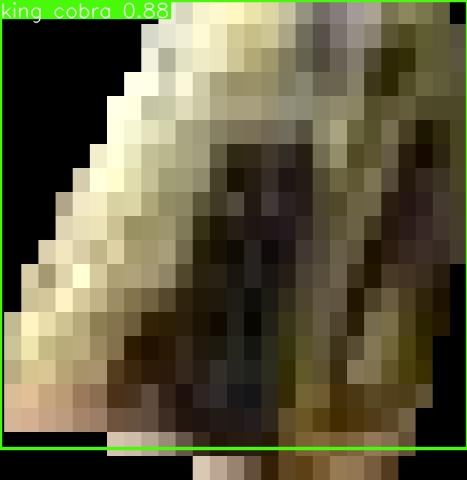

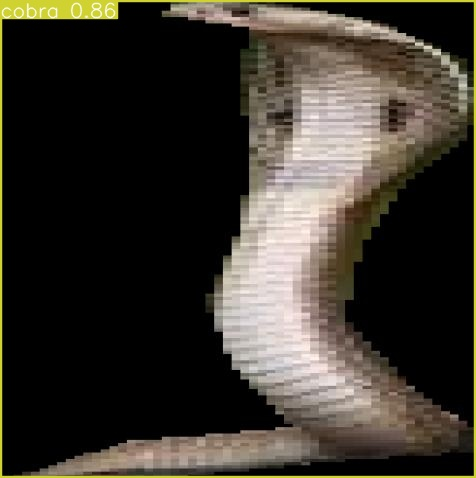

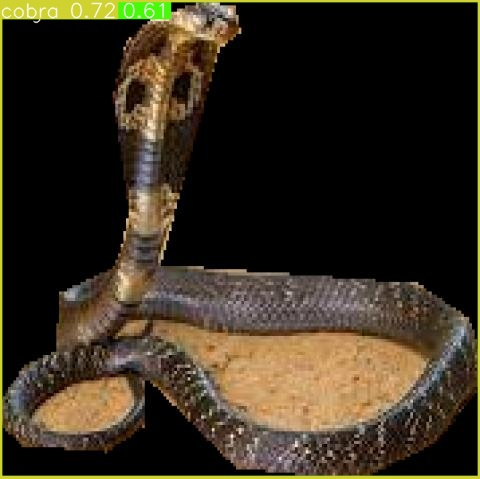

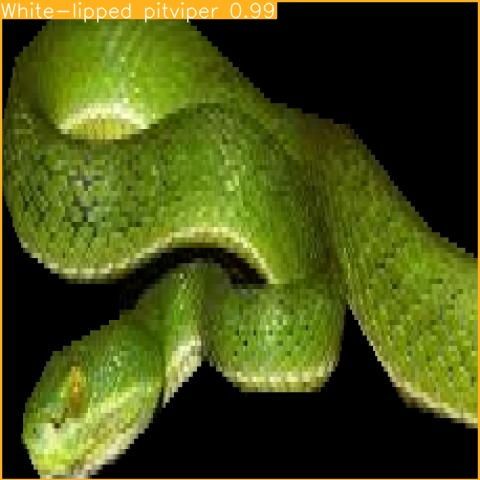

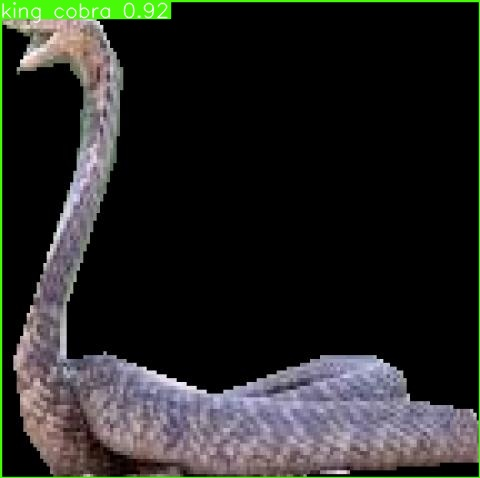

...

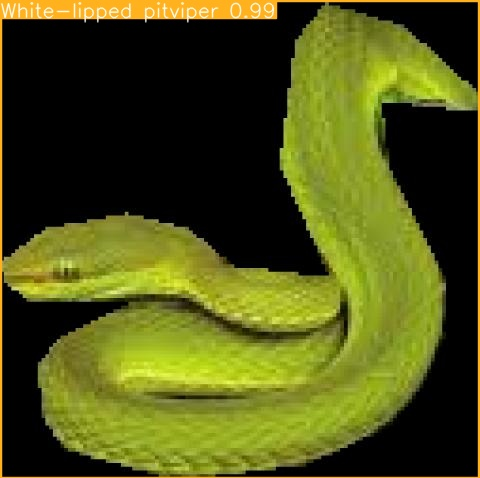

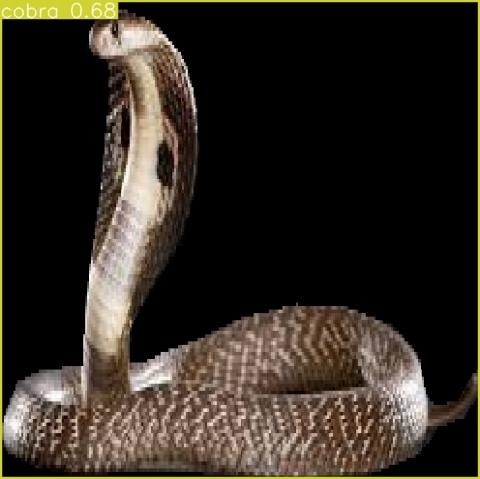

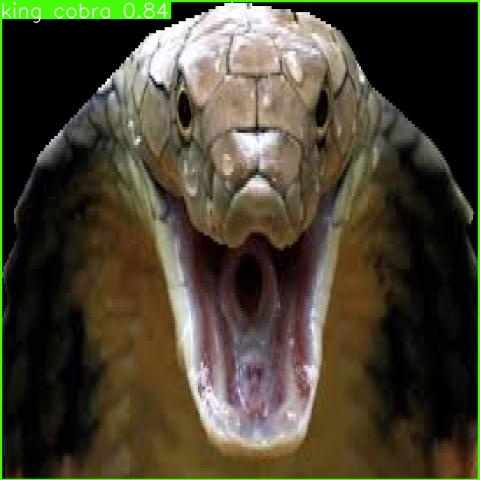

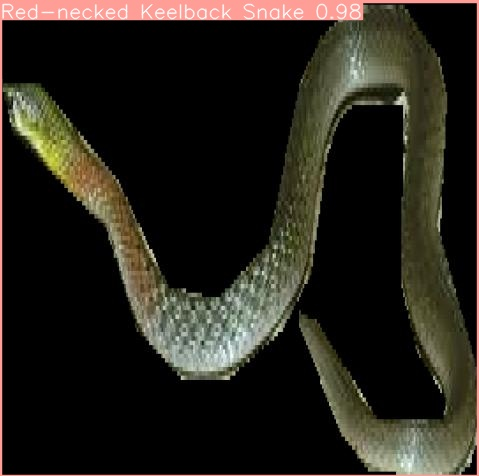

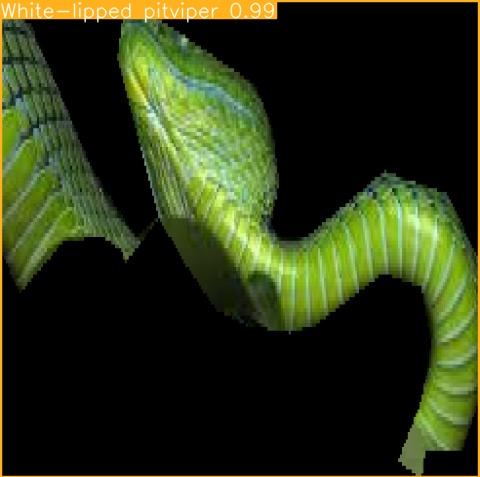

In [15]:
# Case 1
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path, height=300))
  print ("\n")

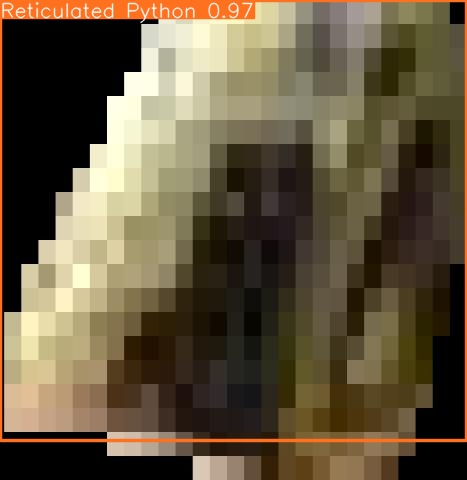

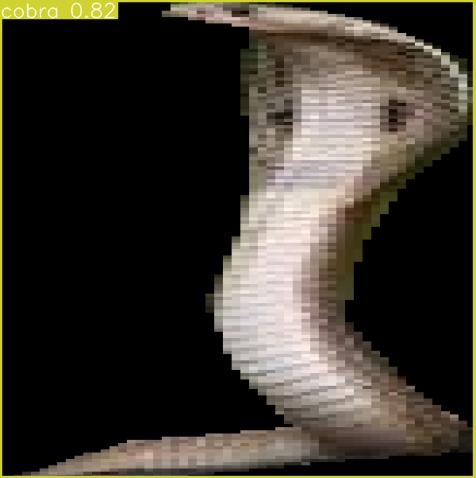

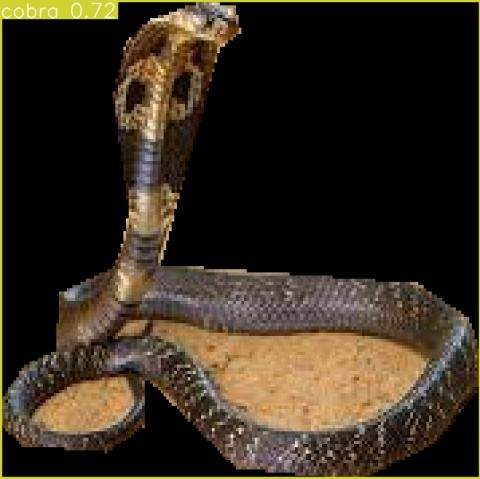

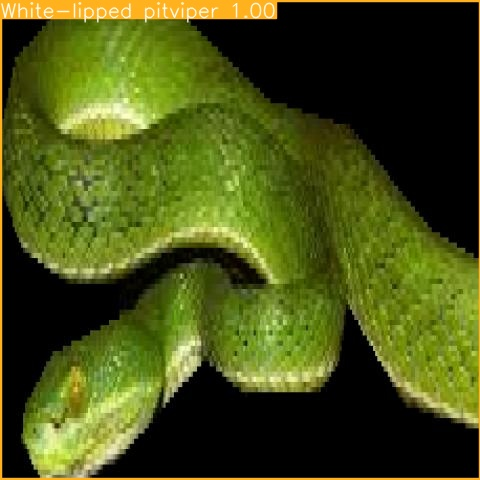

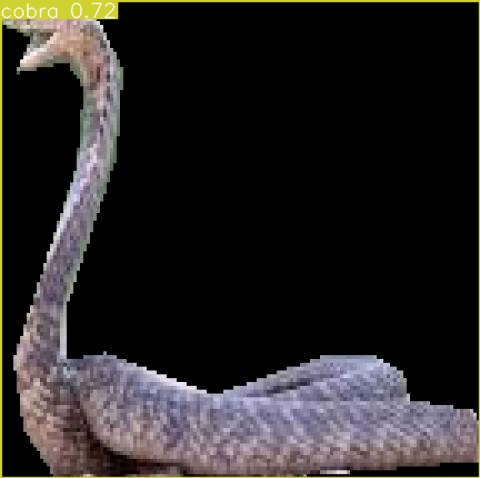

...

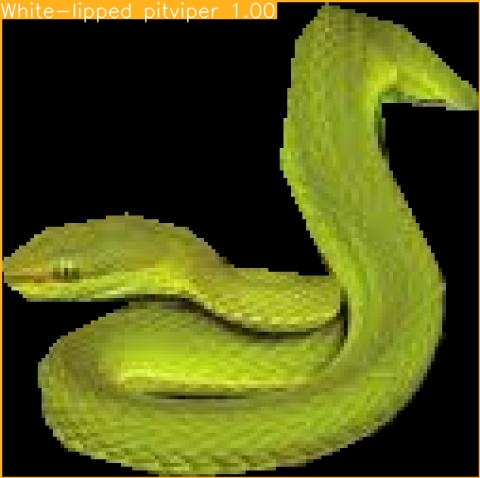

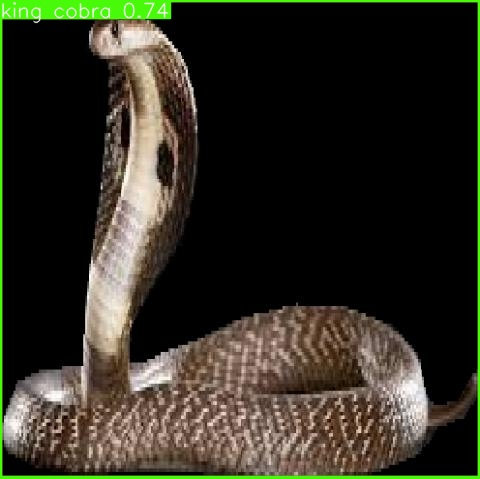

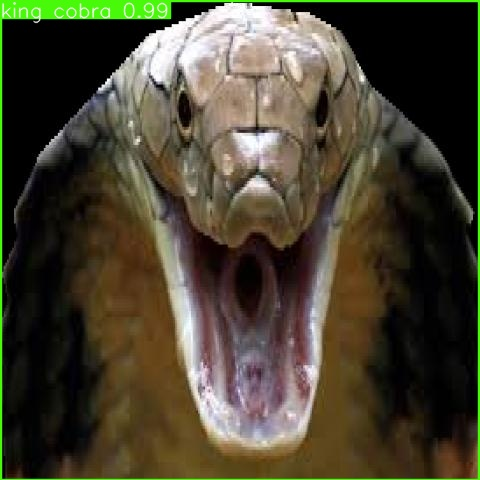

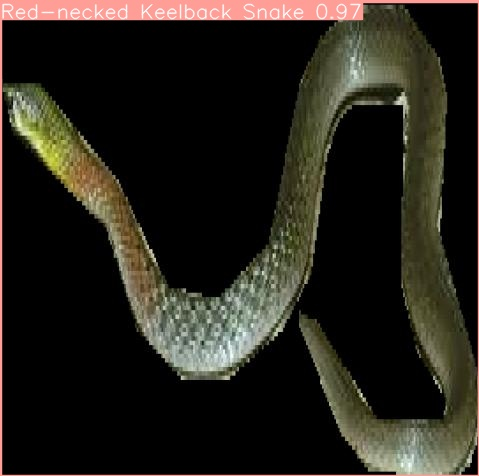

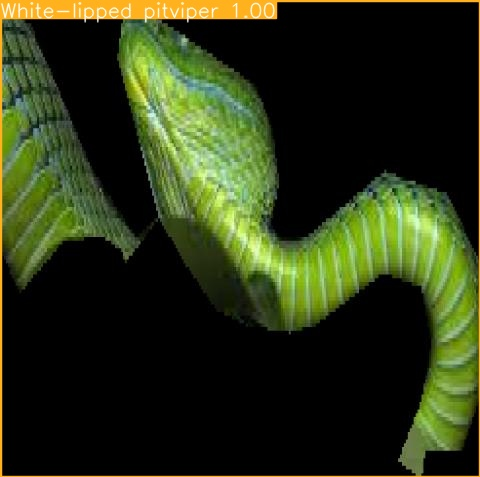

In [16]:
# Case 2
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict2/*.jpg'):
  display(Image(filename=image_path, height=300))
  print ("\n")

The probability scores of Case 2 are closer to 1 which means it predicts with higher accuracy as compared to that of Case 1 which are farther than 1.

Now, let's compare the confusion matrices of Case 1 and Case 2. The confusion matrix is a chart that shows us how our model handles different classes. Ideally it should be downwards diagonally.

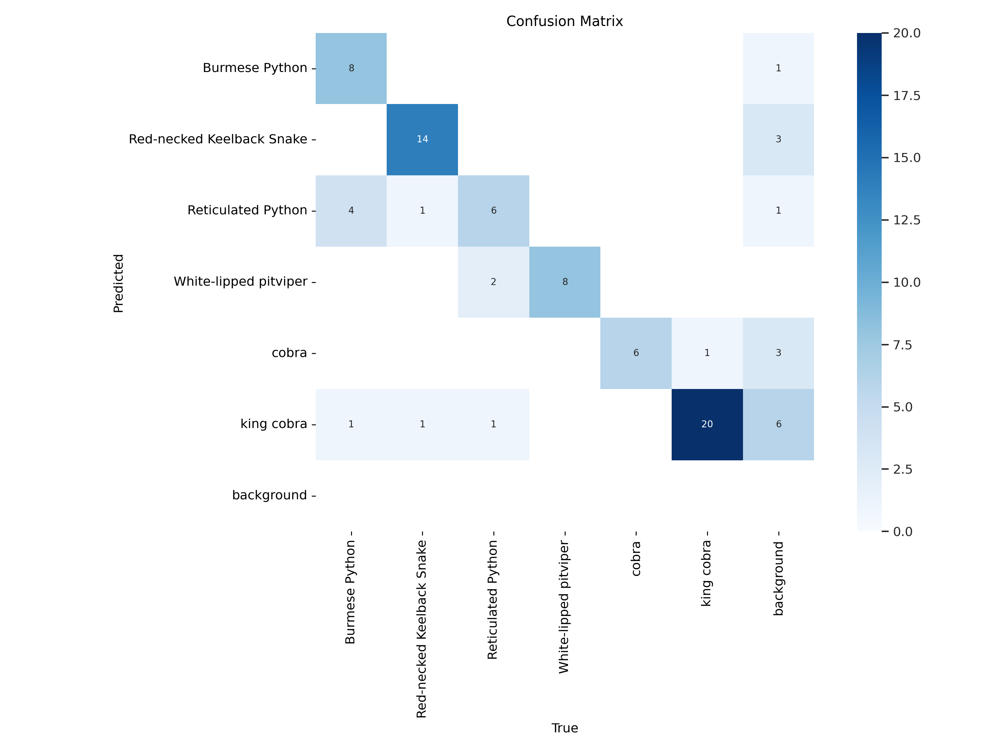

In [17]:
# Case 1
from IPython.display import display, Image
from IPython import display
Image(filename=f'/content/runs/detect/val2/confusion_matrix.png', width=600)

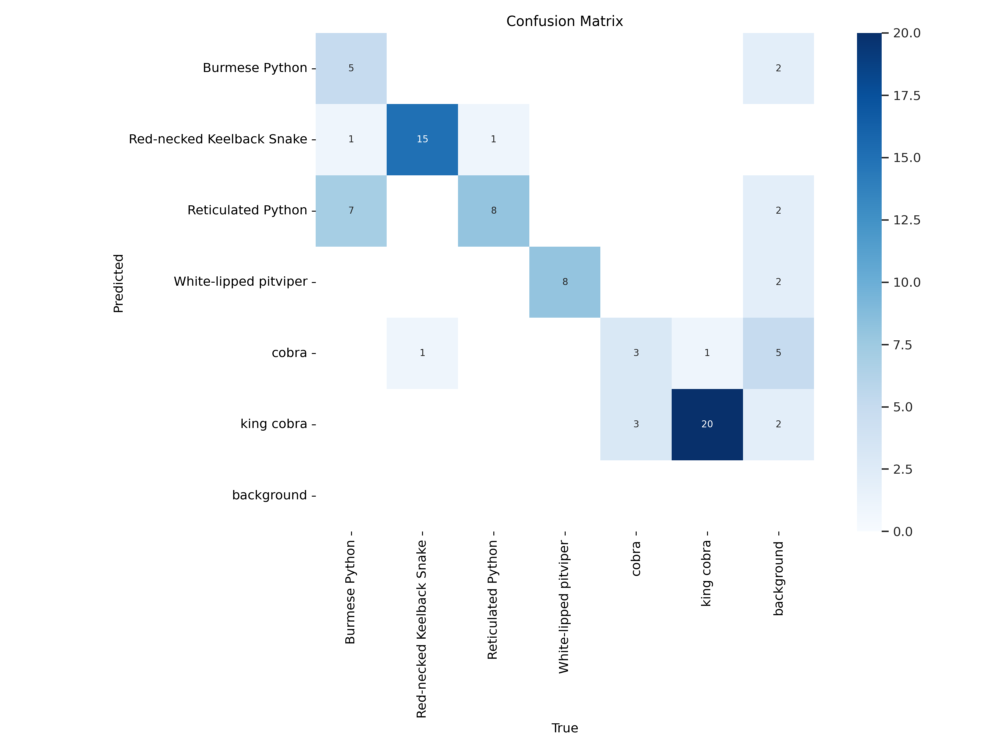

In [18]:
# Case 2
from IPython.display import display, Image
from IPython import display
Image(filename=f'/content/runs/detect/val4/confusion_matrix.png', width=600)

If you look at the chart, it shows the classes our model has predicted. On the right, we have the accuracy score which shows the number of times our model has predicted it correctly. 20 is the maximum which means it has predicted it at maximum accuracy and 1 means the accuracy is very low. For instance, in both cases, our model has predicted king cobra with maximum accuracy but in Case 1, the background was predicted as Red-necked Keelback Snake 3 times while in Case 2, this prediction was improved and it didn't show any such results. Overall, Case 2 shows a darker downward diagonal so it's more accurate in making predictions.

Last but not the least, let's take a look at the key matrices displayed by our model in Case 1 and Case 2.

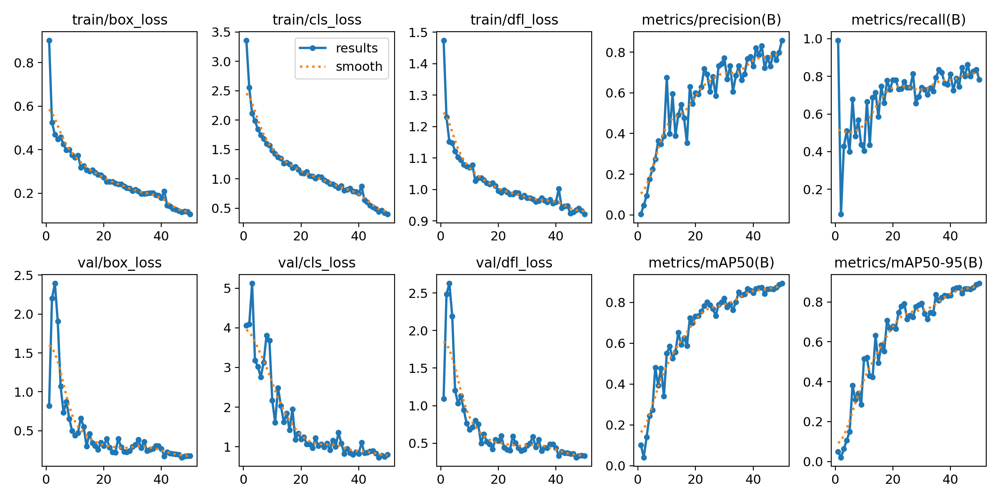

In [19]:
# Case 1
Image(filename=f'/content/runs/detect/train3/results.png', width=600)

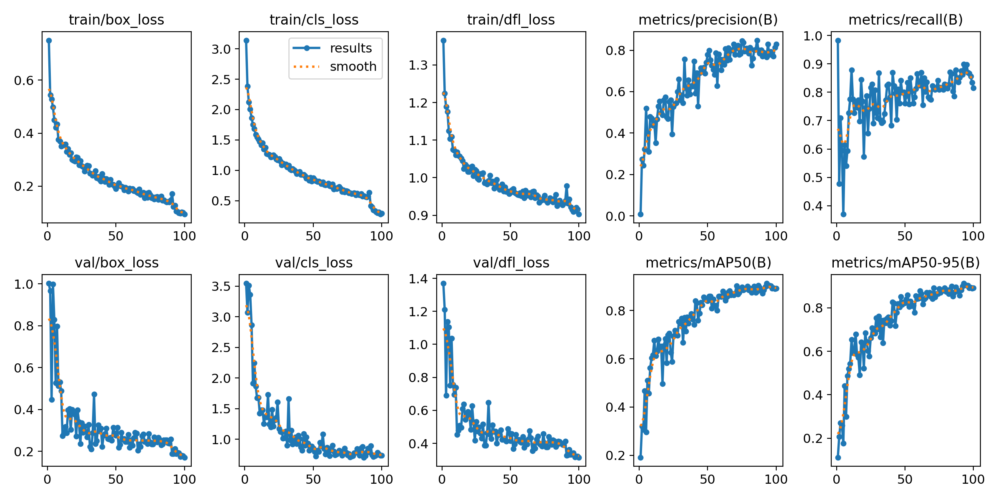

In [20]:
# Case 2
Image(filename=f'/content/runs/detect/train4/results.png', width=600)

As we can see the, in both cases the training losses and validation losses are going down which is a good indicator of the fact that our training and validation in both cases has been done in a proper way. Case 2 is more accurate because it shows less deviation from the orange smooth line as compared to Case 1. If we compare the precision and mean Average Precision metrics of Case 1 and Case 2, we see that the precision of Case 2 is more precise and abrupt.

# Conclusion
Considering the above factors; accuracy of probability scores, the dispersion of predictions diagonally in confusion matrices and charts displaying others key matrics such as precision metrics tracked by YOLOv8 object detection, we can say that number of epochs is directly proportional to the accuracy of a model and inversely proportional to the runtime taken to execute the training code. Therefore, Case 2 is more accurate than Case 1.

# Literature


*   Chollet, F. (2022) Deep learning with python. New York, NY: Manning Publications.


*   Redmon, J. et al. (2015) “You only look once: Unified, real-time object detection.” doi: 10.48550/ARXIV.1506.02640.


*   Terven, J., Córdova-Esparza, D.-M. and Romero-González, J.-A. (2023) “A comprehensive review of YOLO architectures in computer vision: From YOLOv1 to YOLOv8 and YOLO-NAS,” Machine learning and knowledge extraction, 5(4), pp. 1680–1716. doi: 10.3390/make5040083.

